In [1]:
!pip install plotly



[notice] A new release of pip is available: 24.0 -> 24.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go

plt.rcParams['figure.figsize'] = (12,6)
plt.style.use('fivethirtyeight')

import warnings
warnings.filterwarnings("ignore")

In [4]:
import os
print(os.getcwd())

C:\Users\dinesh\crop


In [5]:
import os
if not os.path.exists('Input'):
    os.makedirs('Input')
print(os.listdir('Input'))

[]


In [8]:
#Load the data using pandas read functions
data1 = pd.read_csv('datafile (1).csv')
data2 = pd.read_csv('datafile (2).csv')
data3 = pd.read_csv('datafile (3).csv')
datafile = pd.read_csv('datafile.csv')
produce = pd.read_csv('produce.csv')

In [10]:
data1 = pd.read_csv('datafile (1).csv')

data1 = data1.rename(columns={
    'Crop': 'Crop',
    'State': 'State',
    'Cost of Cultivation (`/Hectare) A2+FL': 'Cost_A2_FL',
    'Cost of Cultivation (`/Hectare) C2': 'Cost_C2',
    'Cost of Production (`/Quintal) C2': 'Cost_Production',
    'Yield (Quintal/ Hectare) ': 'Yield'
})
data1.head().style.set_properties(**{'background-color':'royalblue','color':'black','border-color':'#8b8c8c'})

,Crop,State,Cost_A2_FL,Cost_C2,Cost_Production,Yield
0,ARHAR,Uttar Pradesh,9794.050000,23076.740000,1941.550000,9.830000
1,ARHAR,Karnataka,10593.150000,16528.680000,2172.460000,7.470000
2,ARHAR,Gujarat,13468.820000,19551.900000,1898.300000,9.590000
3,ARHAR,Andhra Pradesh,17051.660000,24171.650000,3670.540000,6.420000
4,ARHAR,Maharashtra,17130.550000,25270.260000,2775.800000,8.720000


In [11]:
#check the shape of the data
print(f' The dataset contains {data1.shape[1]} columns and {data1.shape[0]} rows')

 The dataset contains 6 columns and 49 rows


In [12]:
print(data1.columns)

Index(['Crop', 'State', 'Cost_A2_FL', 'Cost_C2', 'Cost_Production', 'Yield'], dtype='object')


In [13]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49 entries, 0 to 48
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Crop             49 non-null     object 
 1   State            49 non-null     object 
 2   Cost_A2_FL       49 non-null     float64
 3   Cost_C2          49 non-null     float64
 4   Cost_Production  49 non-null     float64
 5   Yield            49 non-null     float64
dtypes: float64(4), object(2)
memory usage: 2.4+ KB


In [14]:
data1.isnull().sum().sum()

np.int64(0)

In [15]:
data1.isna().sum()/len(data1)*100

Crop               0.0
State              0.0
Cost_A2_FL         0.0
Cost_C2            0.0
Cost_Production    0.0
Yield              0.0
dtype: float64

In [16]:
data1.fillna(0, inplace=True)

In [17]:
print('The duplicate values in the data is', data1.duplicated().sum())

The duplicate values in the data is 0


In [18]:
data1.describe().style.background_gradient(cmap='viridis')

,Cost_A2_FL,Cost_C2,Cost_Production,Yield
count,49.000000,49.000000,49.000000,49.000000
mean,20363.537347,31364.666735,1620.537755,98.086735
std,13561.435306,20095.783569,1104.990472,245.293123
min,5483.540000,7868.640000,85.790000,1.320000
25%,12774.410000,19259.840000,732.620000,9.590000
50%,17022.000000,25909.050000,1595.560000,13.700000
75%,24731.060000,35423.480000,2228.970000,36.610000
max,66335.060000,91442.630000,5777.480000,1015.450000


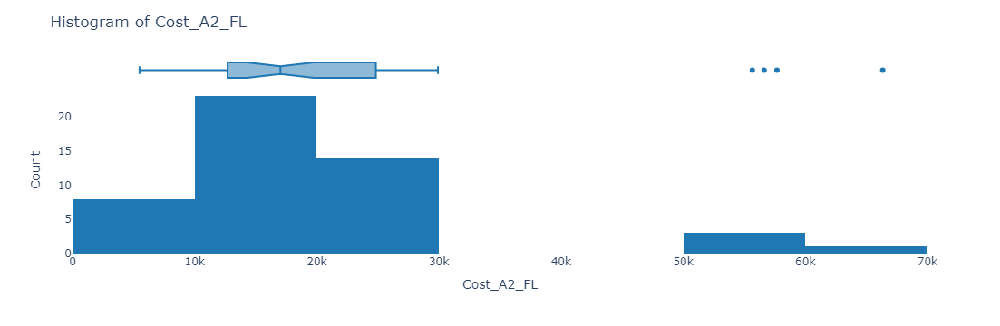

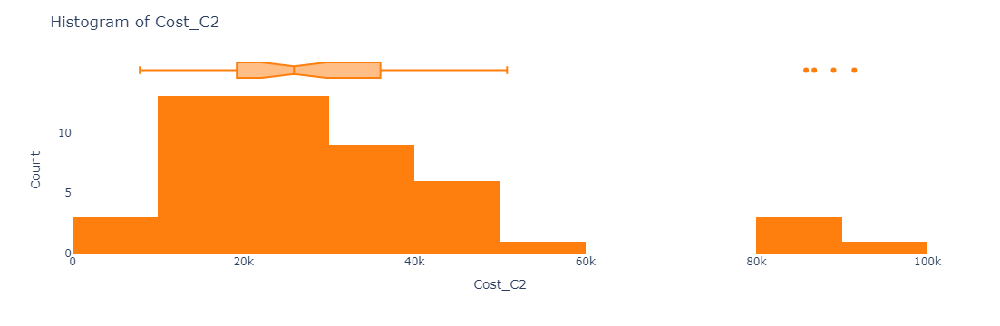

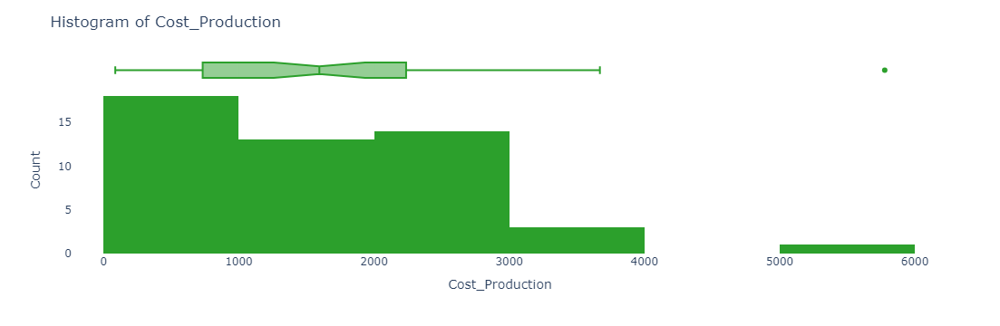

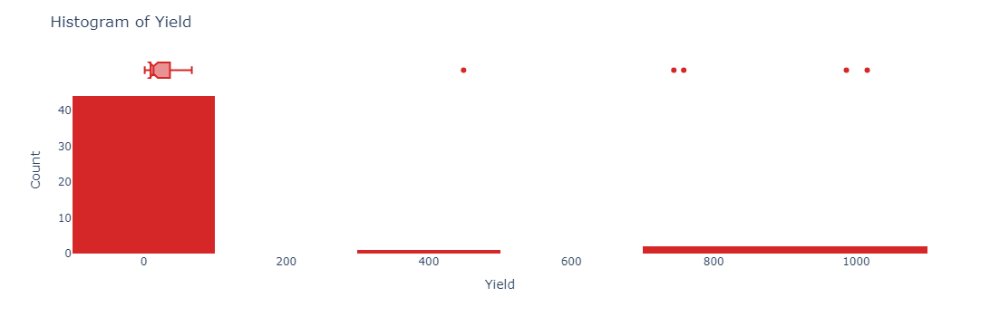

In [19]:
import plotly.express as px

# Color palette for the histograms
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

# EDA - Histogram
column_names = ['Cost_A2_FL', 'Cost_C2', 'Cost_Production', 'Yield']

for i, column in enumerate(column_names):
    fig = px.histogram(data1, x=column, nbins=10, marginal='box',
                       labels={column: column})
    fig.update_layout(title=f'Histogram of {column}', xaxis_title=column, yaxis_title='Count',
                      plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)',
                      font=dict(size=12))
    fig.update_traces(marker_color=colors[i % len(colors)])
    fig.show()

<Figure size 800x600 with 0 Axes>

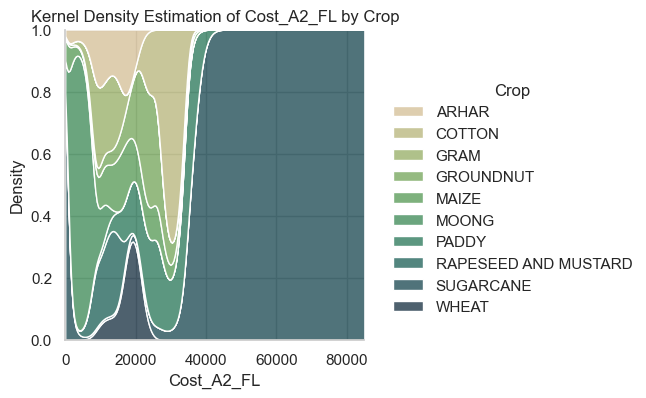

<Figure size 800x600 with 0 Axes>

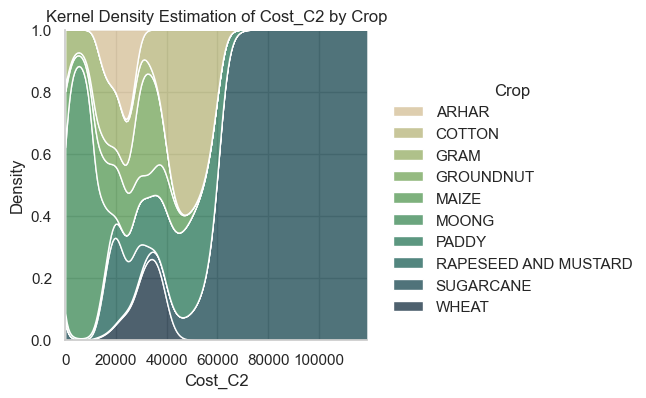

<Figure size 800x600 with 0 Axes>

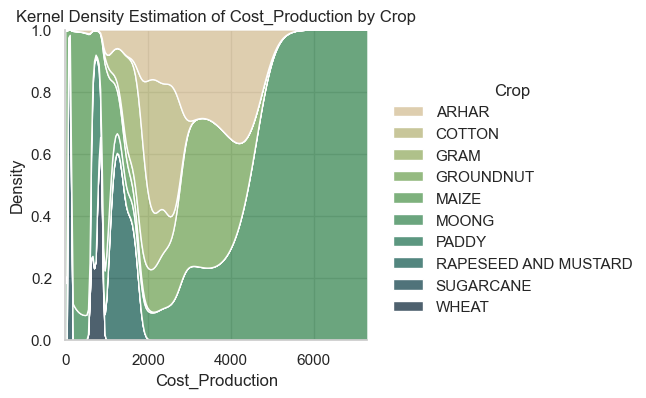

<Figure size 800x600 with 0 Axes>

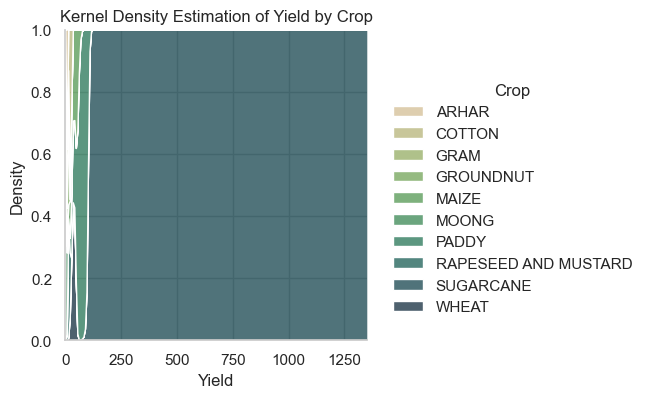

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="whitegrid")

# Plotting 'Cost_A2_FL'
plt.figure(figsize=(8, 6))
sns.displot(data=data1, x='Cost_A2_FL', hue="Crop", kind="kde", height=4, multiple="fill", clip=(0, None), palette="ch:rot=-.75,hue=1,light=.75")
plt.title('Kernel Density Estimation of Cost_A2_FL by Crop')
plt.xlabel('Cost_A2_FL')
plt.ylabel('Density')
plt.show()

# Plotting 'Cost_C2'
plt.figure(figsize=(8, 6))
sns.displot(data=data1, x='Cost_C2', hue="Crop", kind="kde", height=4, multiple="fill", clip=(0, None), palette="ch:rot=-.75,hue=1,light=.75")
plt.title('Kernel Density Estimation of Cost_C2 by Crop')
plt.xlabel('Cost_C2')
plt.ylabel('Density')
plt.show()

# Plotting 'Cost_Production'
plt.figure(figsize=(8, 6))
sns.displot(data=data1, x='Cost_Production', hue="Crop", kind="kde", height=4, multiple="fill", clip=(0, None), palette="ch:rot=-.75,hue=1,light=.75")
plt.title('Kernel Density Estimation of Cost_Production by Crop')
plt.xlabel('Cost_Production')
plt.ylabel('Density')
plt.show()

# Plotting 'Yield'
plt.figure(figsize=(8, 6))
sns.displot(data=data1, x='Yield', hue="Crop", kind="kde", height=4, multiple="fill", clip=(0, None), palette="ch:rot=-.75,hue=1,light=.75")
plt.title('Kernel Density Estimation of Yield by Crop')
plt.xlabel('Yield')
plt.ylabel('Density')
plt.show()

In [21]:
states_in_data = data1['State'].unique()
print('\n The states in the data:', states_in_data)

dominant_state = data1['State'].value_counts().idxmax()
print('\n The Dominant state:', dominant_state)

less_dominant_state = data1['State'].value_counts().idxmin()
print('\n The Less Dominant State:', less_dominant_state)

max_and_min_yield = (data1['Yield'].min(), data1['Yield'].max())
print('\nThe Minimum yield range:', max_and_min_yield)

most_demand_crop = data1['Crop'].value_counts().idxmax()
print('\nThe most demanded crop in the data:', most_demand_crop)

less_demand_crop = data1['Crop'].value_counts().idxmax()
print('\nThe less demanded crop in the data:', less_demand_crop)


 The states in the data: ['Uttar Pradesh' 'Karnataka' 'Gujarat' 'Andhra Pradesh' 'Maharashtra'
 'Punjab' 'Haryana' 'Rajasthan' 'Madhya Pradesh' 'Tamil Nadu' 'Bihar'
 'Orissa' 'West Bengal']

 The Dominant state: Andhra Pradesh

 The Less Dominant State: Bihar

The Minimum yield range: (np.float64(1.32), np.float64(1015.45))

The most demanded crop in the data: ARHAR

The less demanded crop in the data: ARHAR


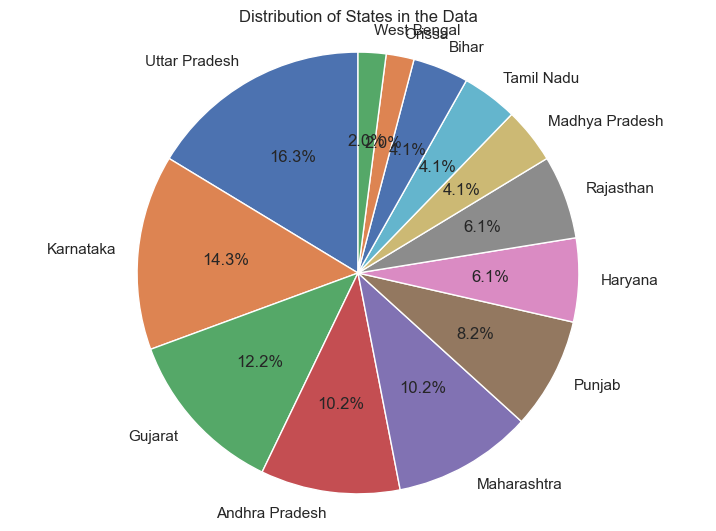

In [22]:
import matplotlib.pyplot as plt

# What are the unique states in the data
states_in_data = data1['State'].unique()

# Calculate the counts of each unique state
state_counts = data1['State'].value_counts()

# Plot a pie chart for the state counts
plt.figure(figsize=(8, 6))
plt.pie(state_counts, labels=states_in_data, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of States in the Data')
plt.axis('equal')
plt.show()

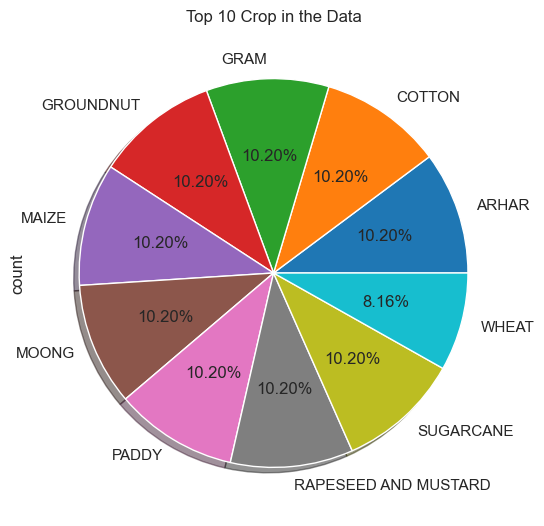

In [23]:
color = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

label = ['ARHAR', 'COTTON', 'GRAM', 'GROUNDNUT', 'MAIZE', 'MOONG', 'PADDY', 'RAPESEED AND MUSTARD', 'SUGARCANE', 'WHEAT']

data1['Crop'].value_counts().sort_values(ascending=False).head(10)\
.plot(kind = 'pie',labels=label, colors=color,
      autopct ='%1.2f%%',
      shadow=True)
plt.title('Top 10 Crop in the Data')
plt.show()

In [24]:
state_list = data1['State'].unique()

# Print the state list
print("List of State:")
for state in state_list:
    print(state)

List of State:
Uttar Pradesh
Karnataka
Gujarat
Andhra Pradesh
Maharashtra
Punjab
Haryana
Rajasthan
Madhya Pradesh
Tamil Nadu
Bihar
Orissa
West Bengal


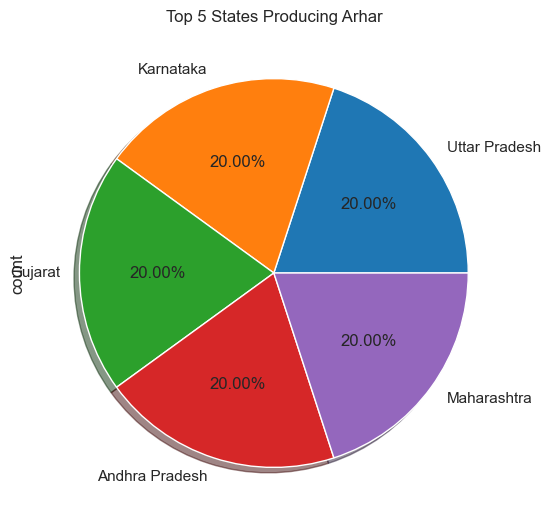

In [25]:
arhar = data1[data1['Crop']=='ARHAR']
label = ['Uttar Pradesh','Karnataka','Gujarat','Andhra Pradesh',
         'Maharashtra','Punjab','Haryana','Rajasthan','Madhya Pradesh',
         'Tamil Nadu','Bihar','Orissa','West Bengal']
arhar['State'].value_counts().head(10).sort_values(ascending=False)\
    .plot(kind='pie', labels=label,
          colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'],
          autopct='%1.2f%%',
          shadow=True)
plt.title("Top 5 States Producing Arhar")
plt.show()

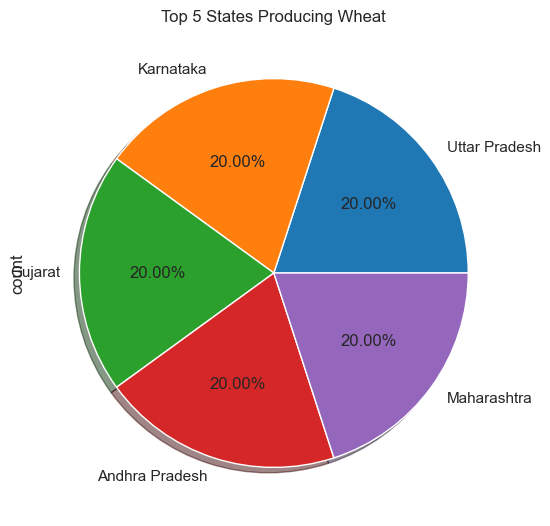

In [26]:
wheat = data1[data1['Crop']=='WHEAT']
label = ['Uttar Pradesh','Karnataka','Gujarat','Andhra Pradesh',
         'Maharashtra','Punjab','Haryana','Rajasthan','Madhya Pradesh',
         'Tamil Nadu','Bihar','Orissa','West Bengal']
arhar['State'].value_counts().head(10).sort_values(ascending=False)\
    .plot(kind='pie', labels=label,
          colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'],
          autopct='%1.2f%%',
          shadow=True)
plt.title("Top 5 States Producing Wheat")
plt.show()

In [27]:
crop_stats = data1.groupby('Crop')[['Cost_A2_FL', 'Cost_C2', 'Cost_Production']].agg(['min', 'max'])
crop_stats.head(10).style.background_gradient(cmap='nipy_spectral_r')

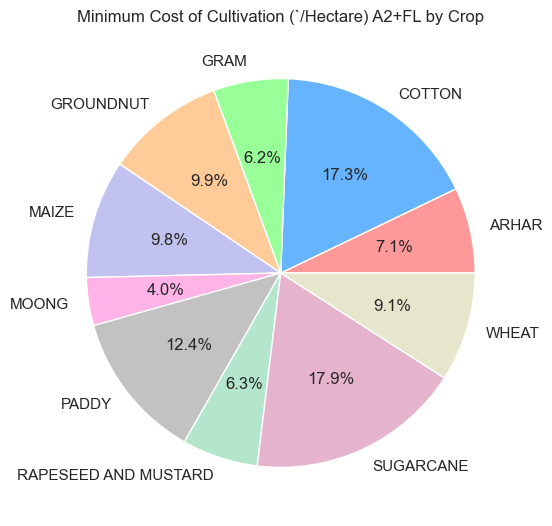

In [28]:
import matplotlib.pyplot as plt

# Data
crop_data = {
    'Crop': ['ARHAR', 'COTTON', 'GRAM', 'GROUNDNUT', 'MAIZE', 'MOONG', 'PADDY', 'RAPESEED AND MUSTARD', 'SUGARCANE', 'WHEAT'],
    'min_Cost_A2_FL': [9794.05, 23711.44, 8552.69, 13647.1, 13513.92, 5483.54, 17022.0, 8686.43, 24538.32, 12464.4],
    'max_Cost_A2_FL': [17130.55, 29918.97, 14421.98, 26078.66, 25687.09, 10780.76, 29664.84, 14715.27, 66335.06, 19119.08],
    'min_Cost_C2': [16528.68, 33116.82, 12610.85, 17314.2, 19810.29, 7868.64, 25909.05, 17705.93, 45239.51, 22489.75],
    'max_Cost_C2': [25270.26, 50828.83, 26762.09, 32683.46, 37801.85, 15371.45, 46450.2, 27507.54, 91442.63, 35423.48],
    'min_Cost_Production': [1898.3, 2003.76, 1551.94, 1918.92, 404.43, 2068.67, 669.86, 1251.12, 85.79, 683.58],
    'max_Cost_Production': [3670.54, 2539.47, 2277.68, 3484.01, 1387.36, 5777.48, 789.9, 1610.4, 119.72, 810.25]
}

# Convert data to a DataFrame
crop_df = pd.DataFrame(crop_data)

# Set Crop column as the index
crop_df.set_index('Crop', inplace=True)

# Plotting
fig, ax = plt.subplots(figsize=(8, 6))
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0', '#ffb3e6', '#c2c2c2', '#b3e6cc', '#e6b3cc', '#e6e6cc']

# Plotting pie chart for min_Cost_A2_FL= Cost of Cultivation (`/Hectare) A2+FL
ax.pie(crop_df['min_Cost_A2_FL'], labels=crop_df.index, autopct='%1.1f%%', colors=colors)
ax.set_title('Minimum Cost of Cultivation (`/Hectare) A2+FL by Crop')

plt.show()

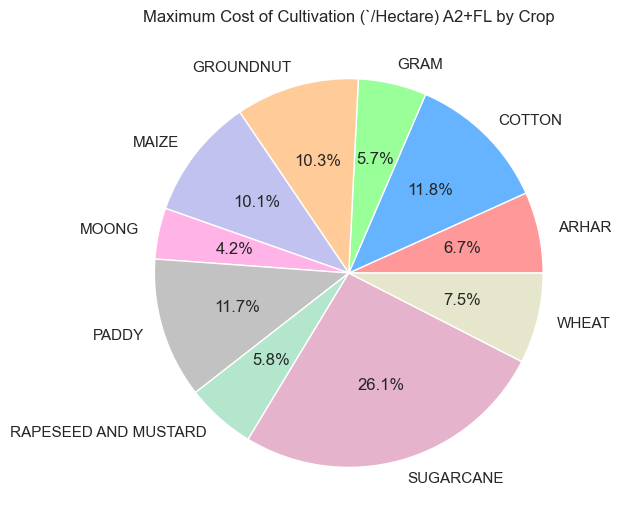

In [29]:
fig, ax = plt.subplots(figsize=(8, 6))
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0', '#ffb3e6', '#c2c2c2', '#b3e6cc', '#e6b3cc', '#e6e6cc']

# Plotting pie chart for max_Cost_A2_FL= Cost of Cultivation (`/Hectare) A2+FL
ax.pie(crop_df['max_Cost_A2_FL'], labels=crop_df.index, autopct='%1.1f%%', colors=colors)
ax.set_title('Maximum Cost of Cultivation (`/Hectare) A2+FL by Crop')

plt.show()

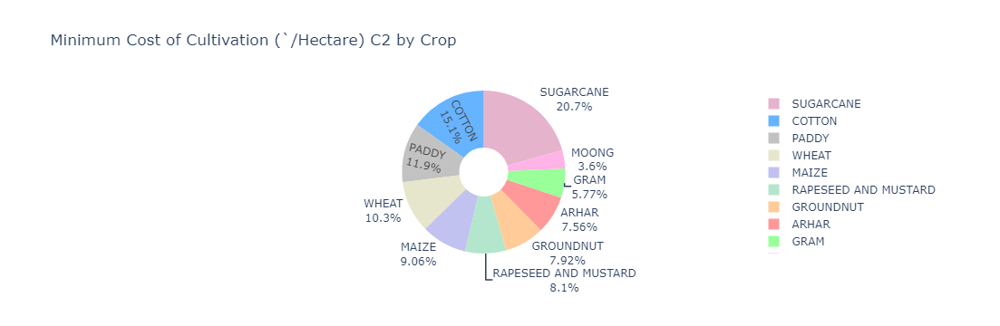

In [30]:
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0', '#ffb3e6', '#c2c2c2', '#b3e6cc', '#e6b3cc', '#e6e6cc']

# Create the pie chart
fig = go.Figure(data=[go.Pie(labels=crop_df.index, values=crop_df['min_Cost_C2'], hole=0.3, textinfo='label+percent', marker=dict(colors=colors))])
fig.update_layout(title='Minimum Cost of Cultivation (`/Hectare) C2 by Crop')

# Show the pie chart
fig.show()

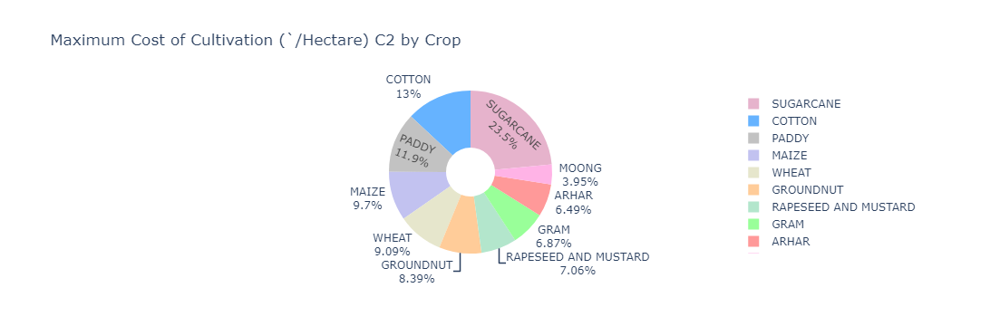

In [31]:
import plotly.graph_objects as go

# Define colors for each pie slice
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0', '#ffb3e6', '#c2c2c2', '#b3e6cc', '#e6b3cc', '#e6e6cc']

# Create the pie chart
fig = go.Figure(data=[go.Pie(labels=crop_df.index, values=crop_df['max_Cost_C2'], hole=0.3, textinfo='label+percent', marker=dict(colors=colors))])
fig.update_layout(title='Maximum Cost of Cultivation (`/Hectare) C2 by Crop')

# Show the pie chart
fig.show()

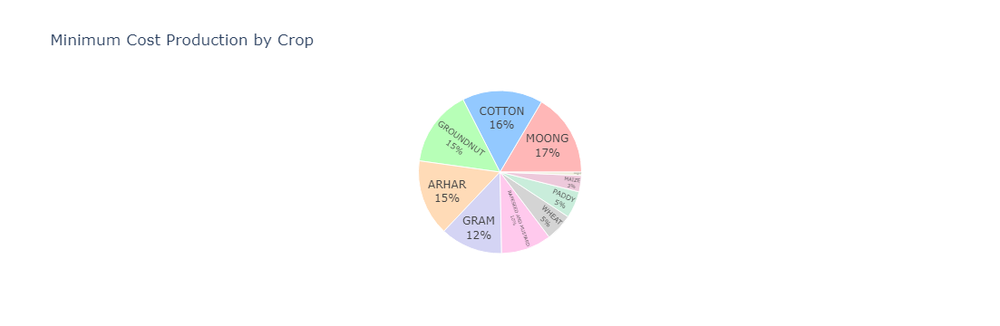

In [32]:
import plotly.graph_objects as go

# Create the sunburst chart
fig = go.Figure(go.Sunburst(
    labels=crop_df.index,
    parents=[''] * len(crop_df.index),
    values=crop_df['min_Cost_Production'],
    branchvalues='total',
    hovertemplate='<b>%{label}</b><br>Value: %{value}<br>Percentage: %{percentRoot:.1%}',
))

fig.update_traces(textinfo='label+percent root')
fig.update_layout(
    title='Minimum Cost Production by Crop',
    sunburstcolorway=['#FF9999', '#66B3FF', '#99FF99', '#FFCC99', '#C2C2F0', '#FFB3E6', '#C2C2C2', '#B3E6CC', '#E6B3CC', '#E6E6CC'],
)

# Show the sunburst chart
fig.show()

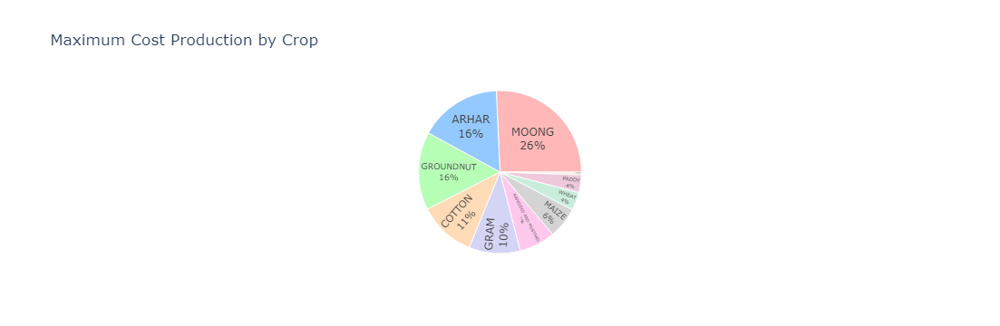

In [33]:
fig = go.Figure(go.Sunburst(
    labels=crop_df.index,
    parents=[''] * len(crop_df.index),
    values=crop_df['max_Cost_Production'],
    branchvalues='total',
    hovertemplate='<b>%{label}</b><br>Value: %{value}<br>Percentage: %{percentRoot:.1%}',
))

fig.update_traces(textinfo='label+percent root')
fig.update_layout(
    title='Maximum Cost Production by Crop',
    sunburstcolorway=['#FF9999', '#66B3FF', '#99FF99', '#FFCC99', '#C2C2F0', '#FFB3E6', '#C2C2C2', '#B3E6CC', '#E6B3CC', '#E6E6CC'],
)

# Show the sunburst chart
fig.show()

In [34]:
crop_min_cost = data1[data1['Cost_Production'] == data1['Cost_Production'].min()]['Crop']
crop_min_cost

44    SUGARCANE
Name: Crop, dtype: object

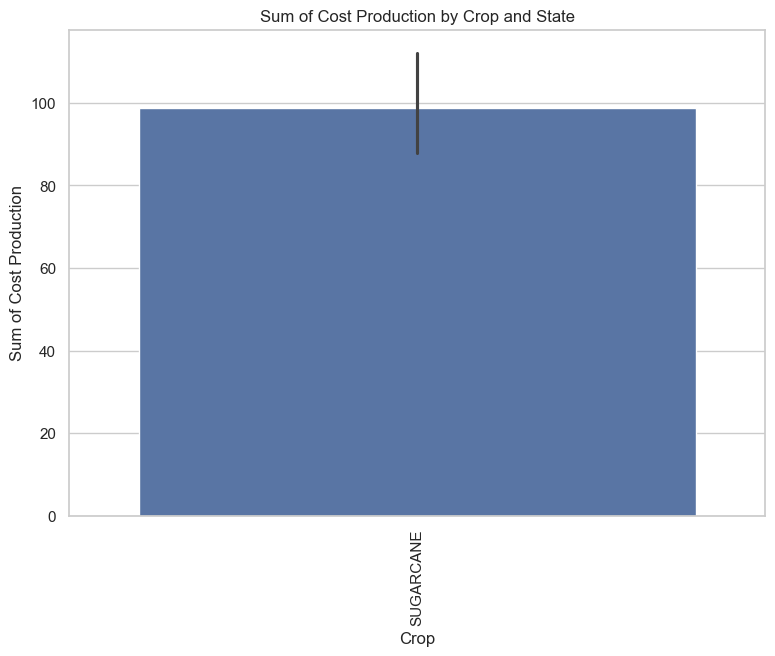

In [35]:
crop_min_cost = data1[data1['Crop'] == 'SUGARCANE'].groupby(['State', 'Crop'])['Cost_Production'].sum()

plt.figure(figsize=(8, 6))
sns.barplot(x=crop_min_cost.index.get_level_values('Crop'), y=crop_min_cost.values)
plt.xlabel('Crop')
plt.ylabel('Sum of Cost Production')
plt.title('Sum of Cost Production by Crop and State')
plt.xticks(rotation=90)
plt.show()

In [36]:
crop_max_cost = data1[data1['Cost_Production'] == data1['Cost_Production'].max()]['Crop']
crop_max_cost

27    MOONG
Name: Crop, dtype: object

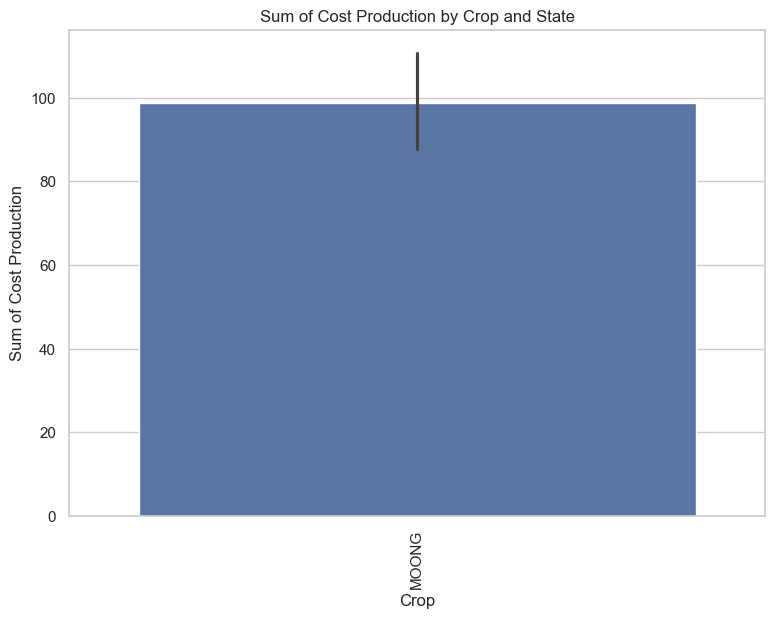

In [37]:
crop_max_cost = data1[data1['Crop'] == 'MOONG'].groupby(['State', 'Crop'])['Cost_Production'].sum()

plt.figure(figsize=(8, 6))
sns.barplot(x=crop_max_cost.index.get_level_values('Crop'), y=crop_min_cost.values)
plt.xlabel('Crop')
plt.ylabel('Sum of Cost Production')
plt.title('Sum of Cost Production by Crop and State')
plt.xticks(rotation=90)
plt.show()

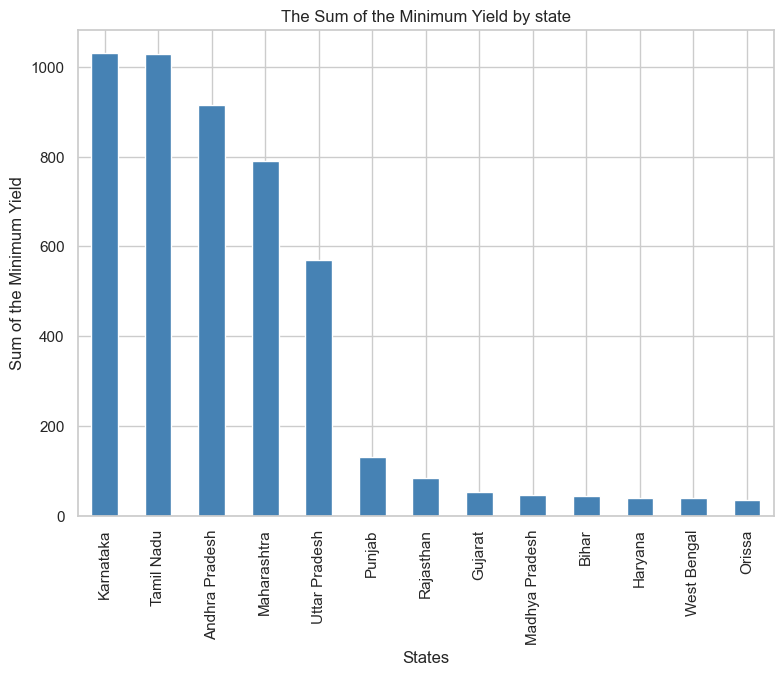

In [38]:
import matplotlib.pyplot as plt
# Create a bar chart to understand which states have the highest minimum yield
data1.groupby('State')['Yield'].sum().sort_values(ascending=False).plot(kind='bar', title="The Sum of the Minimum Yield by state", figsize=(8, 6), color='steelblue')
plt.xlabel("States")
plt.ylabel("Sum of the Minimum Yield")
plt.show()

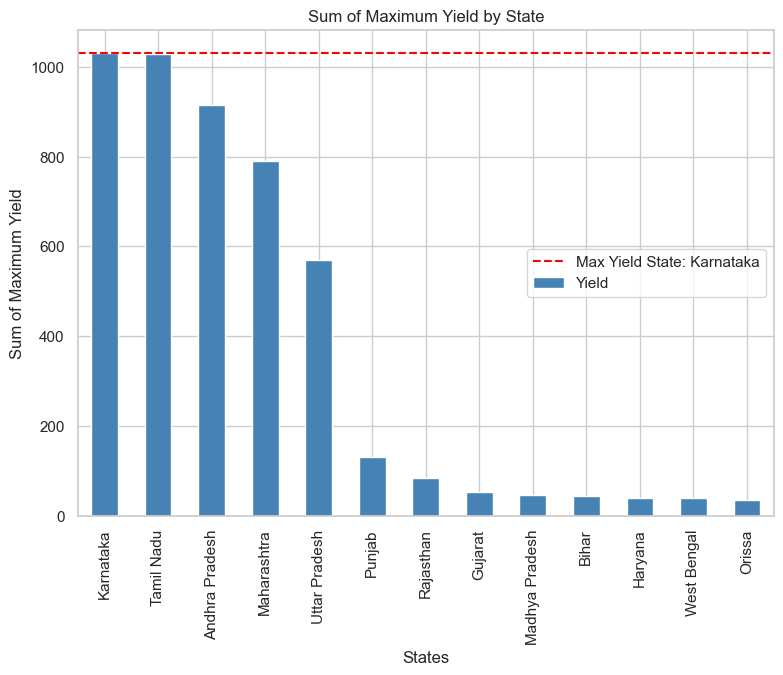

In [39]:
# Calculate the sum of maximum yield for each state
state_yield_sum = data1.groupby('State')['Yield'].sum()

# Find the state with the maximum sum of maximum yield
max_yield_state = state_yield_sum.idxmax()

# Create a bar chart to visualize the sum of maximum yield for each state
state_yield_sum.sort_values(ascending=False).plot(kind='bar', title="Sum of Maximum Yield by State", figsize=(8, 6), color='steelblue')

# Highlight the state with the maximum sum of minimum yield
plt.axhline(y=state_yield_sum[max_yield_state], color='red', linestyle='--', label=f'Max Yield State: {max_yield_state}')

plt.xlabel("States")
plt.ylabel("Sum of Maximum Yield")
plt.legend()
plt.show()

In [40]:
# Count the number of unique crop types
num_crops = data1['Crop'].nunique()

# Print the result
print("Number of unique crop types:", num_crops)

Number of unique crop types: 10


In [41]:
# Get the list of unique crop types
crop_list = data1['Crop'].unique()

# Print the crop list
print("List of crop types:")
for crop in crop_list:
    print(crop)

List of crop types:
ARHAR
COTTON
GRAM
GROUNDNUT
MAIZE
MOONG
PADDY
RAPESEED AND MUSTARD
SUGARCANE
WHEAT


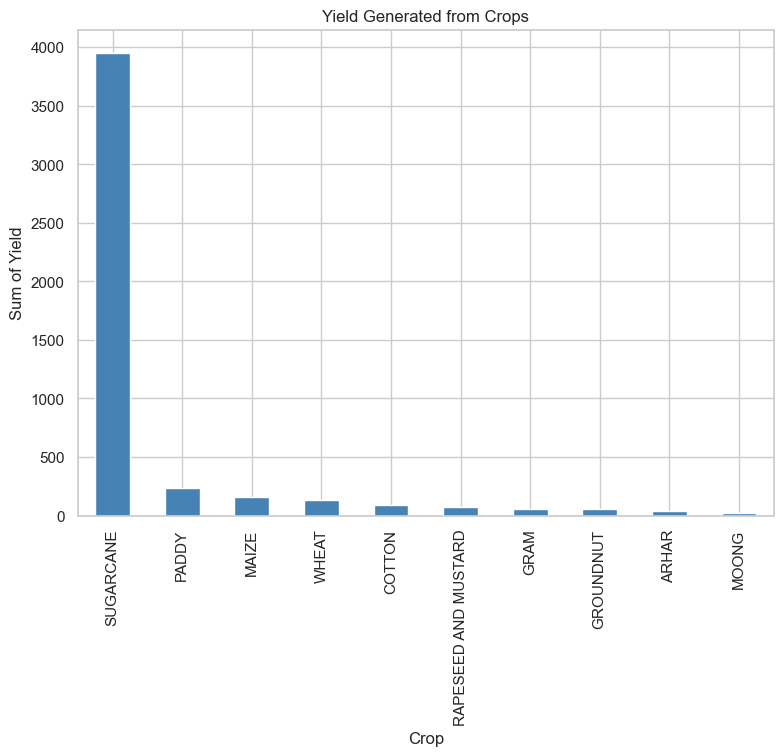

In [42]:
# List of crop types to plot
crop_types = ['ARHAR', 'COTTON', 'GRAM', 'GROUNDNUT', 'MAIZE', 'MOONG', 'PADDY', 'RAPESEED AND MUSTARD', 'SUGARCANE', 'WHEAT']

# Filter data for the selected crop types
filtered_data = data1[data1['Crop'].isin(crop_types)]

# Create a bar chart to find the yield generated from the selected crops
filtered_data.groupby('Crop')['Yield'].sum().sort_values(ascending=False).plot(kind='bar', title='Yield Generated from Crops', figsize=(8, 6), color='steelblue')
plt.xlabel("Crop")
plt.ylabel("Sum of Yield")
plt.show()

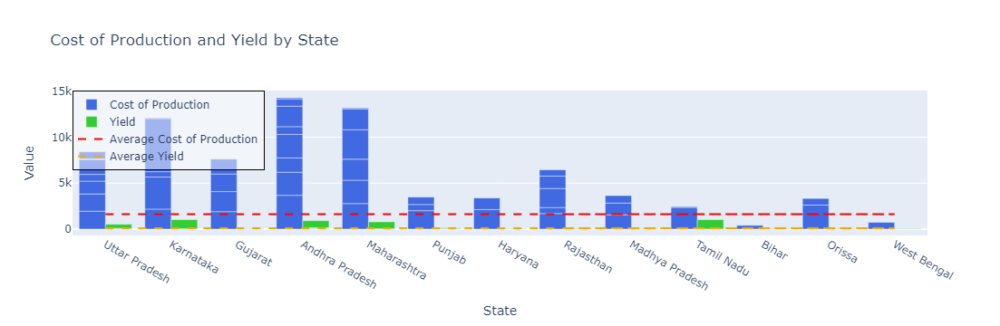

In [43]:
# Calculate average values
avg_cost_production = data1['Cost_Production'].mean()
avg_yield = data1['Yield'].mean()

# Create a bar plot using plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=data1['State'],
    y=data1['Cost_Production'],
    name='Cost of Production',
    marker_color='royalblue'
))

fig.add_trace(go.Bar(
    x=data1['State'],
    y=data1['Yield'],
    name='Yield',
    marker_color='limegreen'
))

fig.add_trace(go.Scatter(
    x=data1['State'],
    y=[avg_cost_production] * len(data1),
    mode='lines',
    name='Average Cost of Production',
    line=dict(color='red', dash='dash')
))

fig.add_trace(go.Scatter(
    x=data1['State'],
    y=[avg_yield] * len(data1),
    mode='lines',
    name='Average Yield',
    line=dict(color='orange', dash='dash')
))

fig.update_layout(
    title='Cost of Production and Yield by State',
    xaxis_title='State',
    yaxis_title='Value',
    barmode='group',
    legend=dict(x=0, y=1.0, bgcolor='rgba(255, 255, 255, 0.5)', bordercolor='black', borderwidth=1)
)

fig.show()

In [44]:
data2.head().style.set_properties(**{'background-color':'green','color':'white','border-color':'#8b8c8c'})

,Crop,Production 2006-07,Production 2007-08,Production 2008-09,Production 2009-10,Production 2010-11,Area 2006-07,Area 2007-08,Area 2008-09,Area 2009-10,Area 2010-11,Yield 2006-07,Yield 2007-08,Yield 2008-09,Yield 2009-10,Yield 2010-11
0,Total Foodgrains,158.800000,168.600000,171.300000,159.400000,178.900000,128.500000,128.800000,127.600000,126.000000,131.700000,123.600000,130.900000,134.300000,126.500000,135.900000
1,Rice,200.800000,207.900000,213.300000,191.600000,206.400000,168.500000,168.900000,175.100000,161.200000,164.800000,119.200000,123.100000,121.800000,118.900000,125.200000
2,Wheat,131.600000,136.400000,140.100000,140.300000,150.800000,115.000000,115.200000,114.000000,116.900000,119.500000,114.400000,118.400000,122.800000,120.000000,126.300000
3,Jowar,124.300000,137.800000,126.000000,116.500000,121.800000,120.700000,110.600000,107.300000,111.000000,105.200000,103.000000,124.600000,117.400000,105.000000,115.800000
4,Bajra,136.400000,161.500000,143.900000,105.400000,167.900000,94.500000,95.100000,87.000000,88.500000,95.600000,144.300000,169.700000,165.400000,119.000000,175.800000


In [45]:
# Print the column names
print(data2.columns)

Index(['Crop             ', 'Production 2006-07', 'Production 2007-08',
       'Production 2008-09', 'Production 2009-10', 'Production 2010-11',
       'Area 2006-07', 'Area 2007-08', 'Area 2008-09', 'Area 2009-10',
       'Area 2010-11', 'Yield 2006-07', 'Yield 2007-08', 'Yield 2008-09',
       'Yield 2009-10', 'Yield 2010-11'],
      dtype='object')


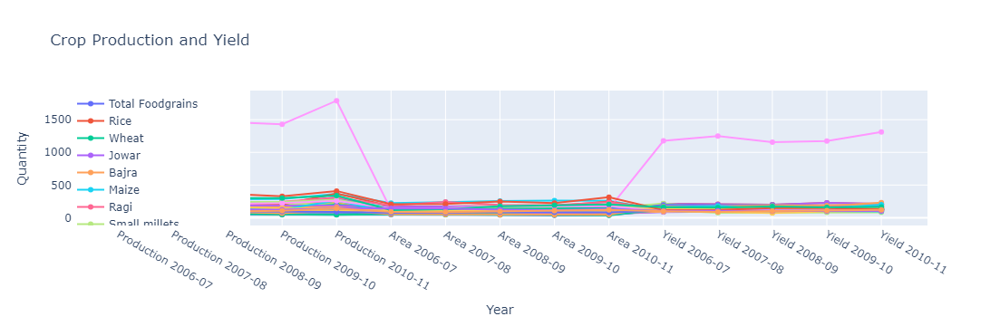

In [46]:
import plotly.graph_objects as go
import pandas as pd

# Create a trace for each crop
traces = []
for crop in data2['Crop             ']:
    trace = go.Scatter(x=data2.columns[1:], y=data2[data2['Crop             '] == crop].values.flatten()[1:], mode='lines+markers', name=crop)
    traces.append(trace)

# Create the layout
layout = go.Layout(
    title='Crop Production and Yield',
    xaxis=dict(title='Year'),
    yaxis=dict(title='Quantity'),
    legend=dict(x=0, y=1)
)

# Create the figure
fig = go.Figure(data=traces, layout=layout)

# Show the figure
fig.show()

In [48]:
data3 = pd.read_csv('datafile (2).csv')
data3.head().style.set_properties(**{'background-color':'red','color':'white','border-color':'#8b8c8c'})

,Crop,Production 2006-07,Production 2007-08,Production 2008-09,Production 2009-10,Production 2010-11,Area 2006-07,Area 2007-08,Area 2008-09,Area 2009-10,Area 2010-11,Yield 2006-07,Yield 2007-08,Yield 2008-09,Yield 2009-10,Yield 2010-11
0,Total Foodgrains,158.800000,168.600000,171.300000,159.400000,178.900000,128.500000,128.800000,127.600000,126.000000,131.700000,123.600000,130.900000,134.300000,126.500000,135.900000
1,Rice,200.800000,207.900000,213.300000,191.600000,206.400000,168.500000,168.900000,175.100000,161.200000,164.800000,119.200000,123.100000,121.800000,118.900000,125.200000
2,Wheat,131.600000,136.400000,140.100000,140.300000,150.800000,115.000000,115.200000,114.000000,116.900000,119.500000,114.400000,118.400000,122.800000,120.000000,126.300000
3,Jowar,124.300000,137.800000,126.000000,116.500000,121.800000,120.700000,110.600000,107.300000,111.000000,105.200000,103.000000,124.600000,117.400000,105.000000,115.800000
4,Bajra,136.400000,161.500000,143.900000,105.400000,167.900000,94.500000,95.100000,87.000000,88.500000,95.600000,144.300000,169.700000,165.400000,119.000000,175.800000


In [49]:
print(data3.columns)

Index(['Crop             ', 'Production 2006-07', 'Production 2007-08',
       'Production 2008-09', 'Production 2009-10', 'Production 2010-11',
       'Area 2006-07', 'Area 2007-08', 'Area 2008-09', 'Area 2009-10',
       'Area 2010-11', 'Yield 2006-07', 'Yield 2007-08', 'Yield 2008-09',
       'Yield 2009-10', 'Yield 2010-11'],
      dtype='object')


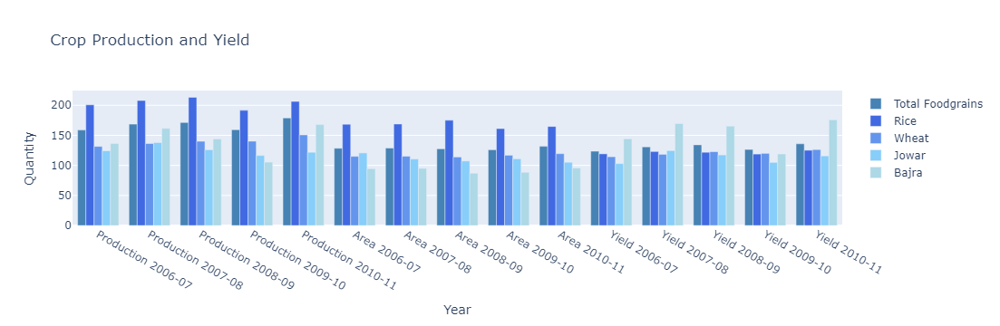

In [50]:
# Define the crops and corresponding colors
crops = ['Total Foodgrains', 'Rice', 'Wheat', 'Jowar', 'Bajra']
colors = ['steelblue', 'royalblue', 'cornflowerblue', 'lightskyblue', 'lightblue']

# Create the traces for each crop
traces = []
for i, crop in enumerate(crops):
    trace = go.Bar(
        x=data3.columns[1:],
        y=data3.loc[data3['Crop             '] == crop, data3.columns[1:]].values.flatten(),
        name=crop,
        marker=dict(color=colors[i])
    )
    traces.append(trace)

# Create the layout
layout = go.Layout(
    title='Crop Production and Yield',
    xaxis=dict(title='Year'),
    yaxis=dict(title='Quantity'),
    barmode='group'
)

# Create the figure
fig = go.Figure(data=traces, layout=layout)

# Show the figure
fig.show()

In [52]:
datafile = pd.read_csv('datafile.csv')
datafile.head().style.set_properties(**{'background-color':'blue','color':'white','border-color':'#8b8c8c'})

,Crop,2004-05,2005-06,2006-07,2007-08,2008-09,2009-10,2010-11,2011-12
0,Rice,100.000000,101.000000,99.000000,105.000000,112.000000,121.000000,117.000000,110.000000
1,Wheat,100.000000,101.000000,112.000000,115.000000,117.000000,127.000000,120.000000,108.000000
2,Coarse Cereals,100.000000,107.000000,110.000000,115.000000,113.000000,123.000000,122.000000,136.000000
3,Pulses,100.000000,108.000000,134.000000,124.000000,124.000000,146.000000,137.000000,129.000000
4,Vegetables,100.000000,109.000000,103.000000,118.000000,113.000000,124.000000,128.000000,115.000000


In [53]:
print(datafile.columns)

Index(['Crop', '2004-05', '2005-06', '2006-07', '2007-08', '2008-09',
       '2009-10', '2010-11', '2011-12'],
      dtype='object')


In [54]:
datafile.isnull().sum().sum()

np.int64(9)

In [55]:
datafile.fillna(0, inplace=True)

In [56]:
print('The duplicate values in the datafile is', datafile.duplicated().sum())

The duplicate values in the datafile is 0


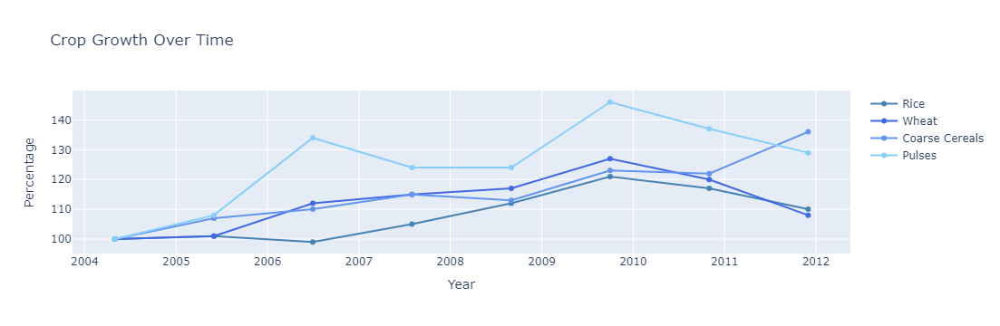

In [57]:
import plotly.graph_objects as go
import pandas as pd

# Define the crops and corresponding colors
crops = ['Rice', 'Wheat', 'Coarse Cereals', 'Pulses', 'Vegetables']
colors = ['steelblue', 'royalblue', 'cornflowerblue', 'lightskyblue', 'lightblue']

# Create the traces for each crop
traces = []
for i, crop in enumerate(crops):
    trace = go.Scatter(
        x=datafile.columns[1:],
        y=datafile.loc[datafile['Crop'] == crop, datafile.columns[1:]].values.flatten(),
        mode='lines+markers',
        name=crop,
        line=dict(color=colors[i])
    )
    traces.append(trace)

# Create the layout
layout = go.Layout(
    title='Crop Growth Over Time',
    xaxis=dict(title='Year'),
    yaxis=dict(title='Percentage'),
)

# Create the figure
fig = go.Figure(data=traces, layout=layout)

# Show the figure
fig.show()

In [59]:
produce = pd.read_csv('produce.csv')
produce.head().style.set_properties(**{'background-color':'yellow','color':'black','border-color':'#8b8c8c'})

,Particulars,Frequency,Unit,3-1993,3-1994,3-1995,3-1996,3-1997,3-1998,3-1999,3-2000,3-2001,3-2002,3-2003,3-2004,3-2005,3-2006,3-2007,3-2008,3-2009,3-2010,3-2011,3-2012,3-2013,3-2014
0,Agricultural Production Foodgrains,"Annual, Ending mar Of Each Year",Ton mn,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,198.362820,208.601600,217.282120,230.775040,234.466177,218.107372,244.491809,259.286253,257.130000,264.380600
1,Agricultural Production Foodgrains Kharif,"Annual, Ending mar Of Each Year",Ton mn,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,103.309420,109.873400,110.576220,120.957240,118.138577,103.954032,120.853191,131.274812,128.070000,129.368600
2,Agricultural Production Foodgrains Rabi,"Annual, Ending mar Of Each Year",Ton mn,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,95.053400,98.728200,106.705900,109.817800,116.327600,114.153340,123.638618,128.011441,129.060000,135.012000
3,Agricultural Production Foodgrains Rice,"Annual, Ending mar Of Each Year",Ton mn,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,83.131700,91.793400,93.355300,96.692900,99.182500,89.092901,95.979819,105.301100,105.240000,106.287200
4,Agricultural Production Foodgrains Rice Kharif,"Annual, Ending mar Of Each Year",Ton mn,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,72.230000,78.271900,80.170800,82.659400,84.908200,75.916510,80.651241,92.780700,92.370000,92.009300


In [60]:
print(produce.columns)

Index(['Particulars', 'Frequency', 'Unit', ' 3-1993', ' 3-1994', ' 3-1995',
       ' 3-1996', ' 3-1997', ' 3-1998', ' 3-1999', ' 3-2000', ' 3-2001',
       ' 3-2002', ' 3-2003', ' 3-2004', ' 3-2005', ' 3-2006', ' 3-2007',
       ' 3-2008', ' 3-2009', ' 3-2010', ' 3-2011', ' 3-2012', ' 3-2013',
       ' 3-2014'],
      dtype='object')


In [61]:
produce.isnull().sum().sum()

np.int64(5166)

In [62]:
produce.fillna(0, inplace=True)

In [63]:
print('The duplicate values in the produce is', produce.duplicated().sum())

The duplicate values in the produce is 0


In [64]:
produce.head()

,Particulars,Frequency,Unit,3-1993,3-1994,3-1995,3-1996,3-1997,3-1998,3-1999,...,3-2005,3-2006,3-2007,3-2008,3-2009,3-2010,3-2011,3-2012,3-2013,3-2014
0,Agricultural Production Foodgrains,"Annual, Ending mar Of Each Year",Ton mn,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,198.36282,208.6016,217.28212,230.77504,234.466177,218.107372,244.491809,259.286253,257.13,264.3806
1,Agricultural Production Foodgrains Kharif,"Annual, Ending mar Of Each Year",Ton mn,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,103.30942,109.8734,110.57622,120.95724,118.138577,103.954032,120.853191,131.274812,128.07,129.3686
2,Agricultural Production Foodgrains Rabi,"Annual, Ending mar Of Each Year",Ton mn,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,95.05340,98.7282,106.70590,109.81780,116.327600,114.153340,123.638618,128.011441,129.06,135.0120
3,Agricultural Production Foodgrains Rice,"Annual, Ending mar Of Each Year",Ton mn,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,83.13170,91.7934,93.35530,96.69290,99.182500,89.092901,95.979819,105.301100,105.24,106.2872
4,Agricultural Production Foodgrains Rice Kharif,"Annual, Ending mar Of Each Year",Ton mn,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,72.23000,78.2719,80.17080,82.65940,84.908200,75.916510,80.651241,92.780700,92.37,92.0093


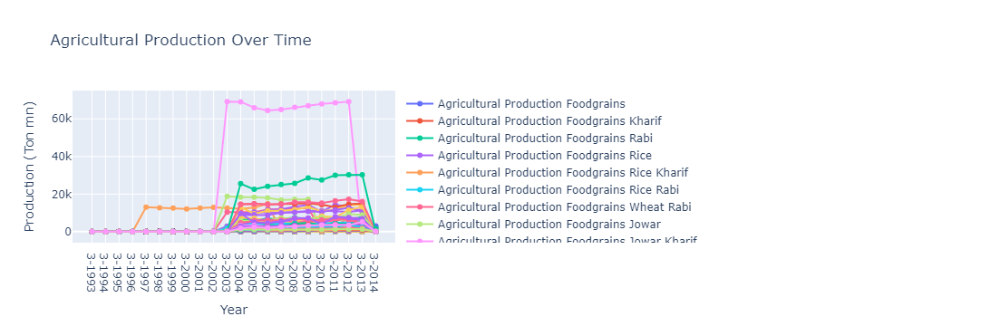

In [65]:
fig = go.Figure()

for i, row in produce.iterrows():
    crop = row['Particulars']
    years = produce.columns[3:]
    production = row[3:]

    fig.add_trace(go.Scatter(
        x=years,
        y=production,
        mode='lines+markers',
        name=crop
    ))

fig.update_layout(
    title='Agricultural Production Over Time',
    xaxis_title='Year',
    yaxis_title='Production (Ton mn)'
)

fig.show()

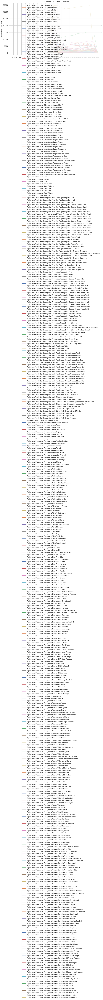

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of the plot
sns.set_style("whitegrid")

# Create the line plot
plt.figure(figsize=(10, 6))
for i, row in produce.iterrows():
    crop = row['Particulars']
    years = produce.columns[3:]
    production = row[3:]
    sns.lineplot(x=years, y=production, label=crop)

# Set the labels and title
plt.xlabel('Year')
plt.ylabel('Production (Ton mn)')
plt.title('Agricultural Production Over Time')

# Display the plot
plt.show()